## Lending Club Case Study

### Data understanding

In [23]:
### Write about what you understood

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from matplotlib.ticker import StrMethodFormatter

import warnings
warnings.filterwarnings('ignore')

In [33]:
lc_df = pd.read_csv('loan.csv')

In [34]:
lc_df.shape

(39717, 111)

In [35]:
lc_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


### Data Cleaning and Manipulation

In [36]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [39]:
# keeping threshold as 80% for missing/NA values
null_columns = round(lc_df.isnull().sum()/lc_df.shape[0] * 100)
missing_val_col = null_columns[null_columns > 80]
missing_val_col

mths_since_last_record             93.0
next_pymnt_d                       97.0
mths_since_last_major_derog       100.0
annual_inc_joint                  100.0
dti_joint                         100.0
verification_status_joint         100.0
tot_coll_amt                      100.0
tot_cur_bal                       100.0
open_acc_6m                       100.0
open_il_6m                        100.0
open_il_12m                       100.0
open_il_24m                       100.0
mths_since_rcnt_il                100.0
total_bal_il                      100.0
il_util                           100.0
open_rv_12m                       100.0
open_rv_24m                       100.0
max_bal_bc                        100.0
all_util                          100.0
total_rev_hi_lim                  100.0
inq_fi                            100.0
total_cu_tl                       100.0
inq_last_12m                      100.0
acc_open_past_24mths              100.0
avg_cur_bal                       100.0


In [40]:
missing_val_col = list(missing_val_col.index)
missing_val_col

['mths_since_last_record',
 'next_pymnt_d',
 'mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percen

In [41]:
missing_val_col
lc_df.drop(missing_val_col, axis = 1,inplace = True)
lc_df

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,80.90,Jun-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,281.94,Jul-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN


In [42]:
lc_df.shape

(39717, 55)

#### Conclusion: Dropped the missing_val_col variable since they have null values more than 80%.

#### Conclusion: Custom behaviour variables should be dropped as well, since they dont add any value to our investigation in finding out the default.
["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type"]

In [43]:
lc_df_columns = ["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type",
"url",
"zip_code",
"addr_state",
"desc",
"title"]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 29)

In [18]:
lc_df_columns = ["id",
"member_id",
"initial_list_status",
"collections_12_mths_ex_med", 
"policy_code",
"acc_now_delinq",
"chargeoff_within_12_mths",
"delinq_amnt",
"tax_liens",
"mths_since_last_delinq"
]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 19)

#### Not sure since these variables are related to past reference and related to particular member it wont be applicable.

#### Conclusion: Drop rows with value "Current" under loan_status column because we are not considering the customer with current loan status

In [19]:
lc_df = lc_df[lc_df["loan_status"] != "Current"]

In [20]:
lc_df.shape

(38577, 19)

In [21]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             38577 non-null  int64  
 1   funded_amnt           38577 non-null  int64  
 2   funded_amnt_inv       38577 non-null  float64
 3   term                  38577 non-null  object 
 4   int_rate              38577 non-null  object 
 5   installment           38577 non-null  float64
 6   grade                 38577 non-null  object 
 7   sub_grade             38577 non-null  object 
 8   emp_title             36191 non-null  object 
 9   emp_length            37544 non-null  object 
 10  home_ownership        38577 non-null  object 
 11  annual_inc            38577 non-null  float64
 12  verification_status   38577 non-null  object 
 13  issue_d               38577 non-null  object 
 14  loan_status           38577 non-null  object 
 15  pymnt_plan         

In [22]:
lc_df.corr()

,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,pub_rec_bankruptcies
loan_amnt,1.000000,0.981790,0.937922,0.932260,0.268999,0.062436,-0.035981
funded_amnt,0.981790,1.000000,0.956172,0.958035,0.264798,0.062194,-0.036995
funded_amnt_inv,0.937922,0.956172,1.000000,0.905464,0.251981,0.070663,-0.041193
installment,0.932260,0.958035,0.905464,1.000000,0.267842,0.052038,-0.033361
annual_inc,0.268999,0.264798,0.251981,0.267842,1.000000,-0.121530,-0.016224
dti,0.062436,0.062194,0.070663,0.052038,-0.121530,1.000000,0.005966
pub_rec_bankruptcies,-0.035981,-0.036995,-0.041193,-0.033361,-0.016224,0.005966,1.000000


In [23]:
lc_df.describe()

,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,pub_rec_bankruptcies
count,38577.000000,38577.000000,38577.000000,38577.000000,3.857700e+04,38577.000000,37880.000000
mean,11047.025430,10784.058506,10222.481123,322.466318,6.877797e+04,13.272727,0.043479
std,7348.441646,7090.306027,7022.720644,208.639215,6.421868e+04,6.673044,0.204583
min,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000
25%,5300.000000,5200.000000,5000.000000,165.740000,4.000000e+04,8.130000,0.000000
50%,9600.000000,9550.000000,8733.440000,277.860000,5.886800e+04,13.370000,0.000000
75%,15000.000000,15000.000000,14000.000000,425.550000,8.200000e+04,18.560000,0.000000
max,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,2.000000


In [ ]:
Insight : The standard deviation is higha which implies Data is highly scattered 

In [55]:
#Find the outliers
# box plot

In [24]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years',
       nan], dtype=object)

#### Since emp_length have nan values removing those rows

In [25]:
lc_df = lc_df[~lc_df.emp_length.isnull()]

In [26]:
lc_df.shape

(37544, 19)

In [27]:
lc_df['issue_d'].unique()

array(['Dec-11', 'Nov-11', 'Oct-11', 'Sep-11', 'Aug-11', 'Jul-11',
       'Jun-11', 'May-11', 'Apr-11', 'Mar-11', 'Feb-11', 'Jan-11',
       'Dec-10', 'Nov-10', 'Oct-10', 'Sep-10', 'Aug-10', 'Jul-10',
       'Jun-10', 'May-10', 'Apr-10', 'Mar-10', 'Feb-10', 'Jan-10',
       'Dec-09', 'Nov-09', 'Oct-09', 'Sep-09', 'Aug-09', 'Jul-09',
       'Jun-09', 'May-09', 'Apr-09', 'Mar-09', 'Feb-09', 'Jan-09',
       'Dec-08', 'Nov-08', 'Oct-08', 'Sep-08', 'Aug-08', 'Jul-08',
       'Jun-08', 'May-08', 'Apr-08', 'Mar-08', 'Feb-08', 'Jan-08',
       'Dec-07', 'Nov-07', 'Oct-07', 'Sep-07', 'Aug-07', 'Jul-07',
       'Jun-07'], dtype=object)

#### Added two columns derived from issue date of the loan

In [28]:
lc_df["issue_d"] = pd.to_datetime(lc_df["issue_d"], format='%b-%y')
lc_df['issue_d_month'] = pd.to_datetime(lc_df['issue_d']).dt.month
lc_df['issue_d_year'] = pd.to_datetime(lc_df['issue_d']).dt.year

In [29]:
lc_df.isnull().sum()

loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title               1408
emp_length                 0
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
pymnt_plan                 0
purpose                    0
dti                        0
pub_rec_bankruptcies     697
issue_d_month              0
issue_d_year               0
dtype: int64

## Data analysis

# Remaining customer behaviour column represents 

 1.   loan_amnt            The listed amount of the loan applied for by the borrower.  
 2.   funded_amnt          The total amount committed to that loan at that point in time.
 3.   funded_amnt_inv      The total amount committed by investors for that loan at that point in time.
 4.   term                 The number of payments on the loan. Values are in months and can be either 36 or 60.
 5.   int_rate             Interest Rate on the loan
 6.   installment          The monthly payment owed by the borrower if the loan originates.
 7.   grade                LC assigned loan grade
 8.   sub_grade             38577 non-null  object 
 9.   emp_title             36191 non-null  object 
 10.  emp_length            37544 non-null  object 
 11.  home_ownership        38577 non-null  object 
 12.  annual_inc            38577 non-null  float64
 13.  verification_status   38577 non-null  object 
 14.  issue_d               38577 non-null  object 
 15.  loan_status           38577 non-null  object 
 16.  pymnt_plan            38577 non-null  object 
 17.  purpose               38577 non-null  object 
 18.  dti                   38577 non-null  float64
 19.  pub_rec_bankruptcies  37880 non-null  float64

In [166]:
lc_df["term"].unique()

array([' 36 months', ' 60 months'], dtype=object)

<Axes: >

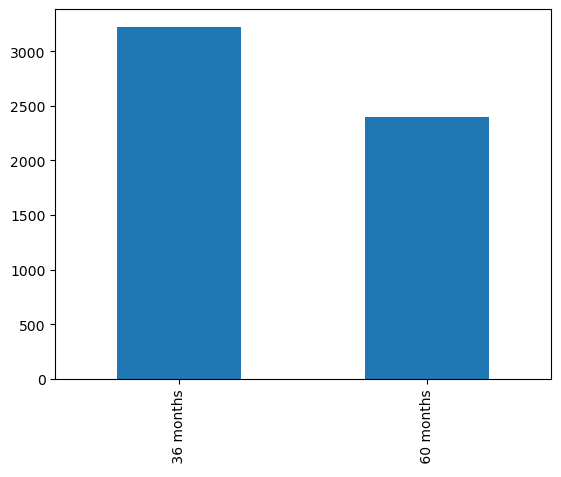

In [52]:
lc_charged_off.term.value_counts().plot(kind='bar')

In [54]:
# Analysis based upon term
# Insight : Short term loan are mostly charged off

In [167]:
lc_df["grade"].unique()

array(['B', 'C', 'A', 'E', 'F', 'D', 'G'], dtype=object)

In [168]:
lc_df["sub_grade"].unique()

array(['B2', 'C4', 'C5', 'C1', 'A4', 'E1', 'F2', 'B5', 'C3', 'B1', 'D1',
       'A1', 'B3', 'B4', 'C2', 'D2', 'A3', 'A5', 'D5', 'A2', 'E4', 'D3',
       'D4', 'F3', 'E3', 'F1', 'E5', 'G4', 'E2', 'G2', 'G1', 'F5', 'F4',
       'G5', 'G3'], dtype=object)

In [169]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years'],
      dtype=object)

<Axes: >

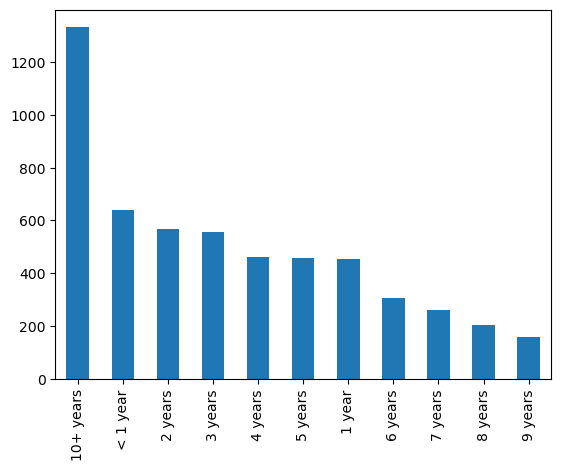

In [53]:
lc_charged_off.emp_length.value_counts().plot(kind='bar')

In [170]:
lc_df["home_ownership"].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER', 'NONE'], dtype=object)

<Axes: >

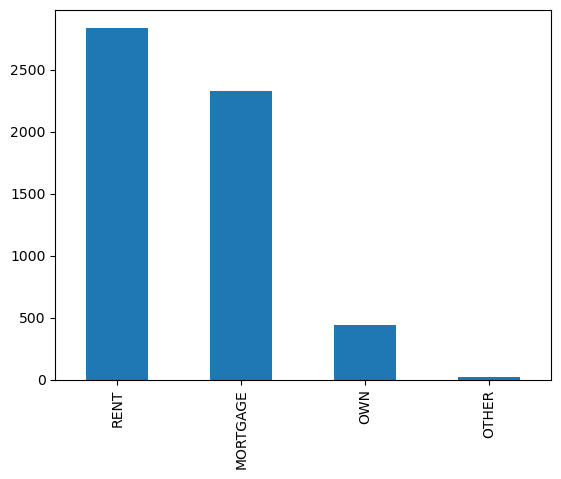

In [49]:
lc_charged_off.home_ownership.value_counts().plot(kind='bar')

In [ ]:
# Analysis based upon home_ownership
# Insight : Most of the charged off customer were on rent 

In [171]:
lc_df["verification_status"].unique()

array(['Verified', 'Source Verified', 'Not Verified'], dtype=object)

<Axes: >

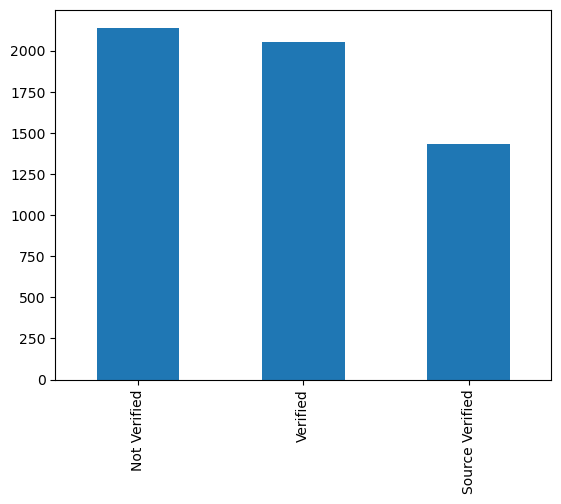

In [50]:
lc_charged_off.verification_status.value_counts().plot(kind='bar')

In [ ]:
# Analysis based upon verification status
# Insight : Source verified customers are less charged off

In [172]:
lc_df["purpose"].unique()

array(['credit_card', 'car', 'small_business', 'other', 'wedding',
       'debt_consolidation', 'home_improvement', 'major_purchase',
       'medical', 'moving', 'vacation', 'house', 'renewable_energy',
       'educational'], dtype=object)

<Axes: >

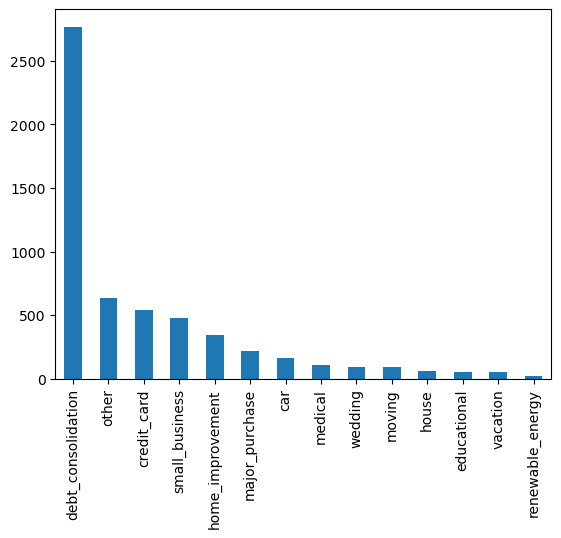

In [51]:
lc_charged_off.purpose.value_counts().plot(kind='bar')

### Conclusion: Above are the categorical varibles with it unique values

In [ ]:
# Analysis based upon purpose
# Insight : Debt consolidation customer are mostly charged off

### Univariate and segmented univariate analysis

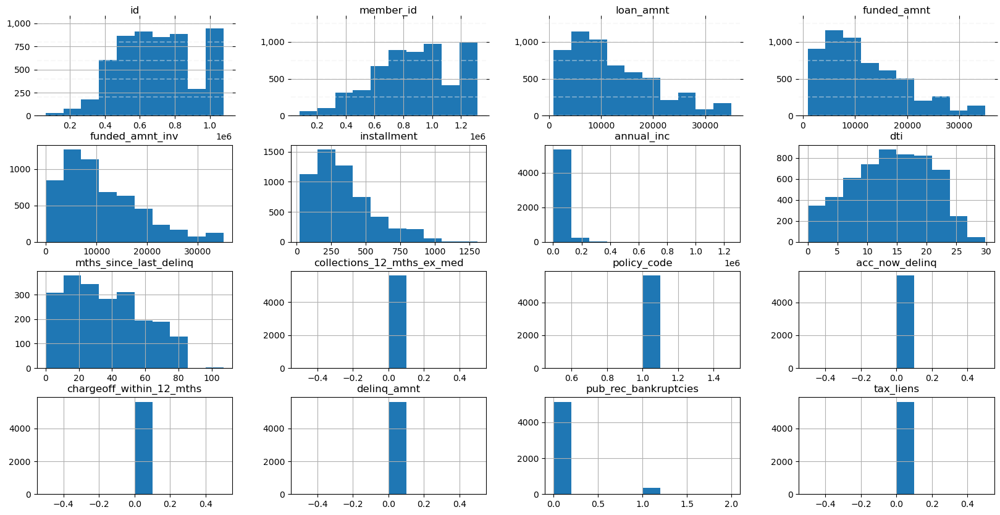

In [45]:
lc_charged_off = lc_df[lc_df['loan_status'] == "Charged Off"]
ax = lc_charged_off.hist(figsize=(20,10))
ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="off")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

In [ ]:
to show funded amount by invester is always less then loan amount and funded amount
graph

In [ ]:
analysis based upon grade and sub grade

In [ ]:
if funded amount is less based on the percentage then more chances of default
graph

In [ ]:
# checking Heart Disease Frequency accroding to age of people
pd.crosstab(df.age,df.target).plot(kind="bar",figsize=(20,6))
plt.title('Heart Disease Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.savefig('heartDiseaseAndAges.png')
plt.show()

In [ ]:
C

In [ ]:
analysis based upon interest rate

In [ ]:
voilin split

In [1]:
fig = px.box(lc_df, x="loan_status", y="loan_amnt",title="Loan amount between loan status")
fig.show()

NameError: name 'px' is not defined

In [109]:
fig = px.box(lc_df, x="loan_status", y="annual_inc",title="Annual income between loan status",)
fig.show()

In [110]:
fig = px.box(lc_df, x="loan_status", y="dti",title="Debt to income ratio between loan status",)
fig.show()

In [111]:
fig = px.box(lc_df, x="loan_status", y="installment",title="Installments between loan status",)
fig.show()

# lc_df.groupby('loan_status').installment.plot.bar()

In [123]:
# plt.figure(figsize=(8,5))

# lc_df.groupby(['loan_status'])['sub_grade'].count().plot(kind='bar')
# plt.ylabel('Sub grade')
# plt.title('Loan status vs Sub grade')
# plt.show()
fig = px.histogram(lc_df, x="sub_grade")
fig.show()

In [175]:
sns.barplot(x='loan_status', y='grade', hue="loan_status", data=lc_df)
plt.show()

TypeError: Neither the `x` nor `y` variable appears to be numeric.

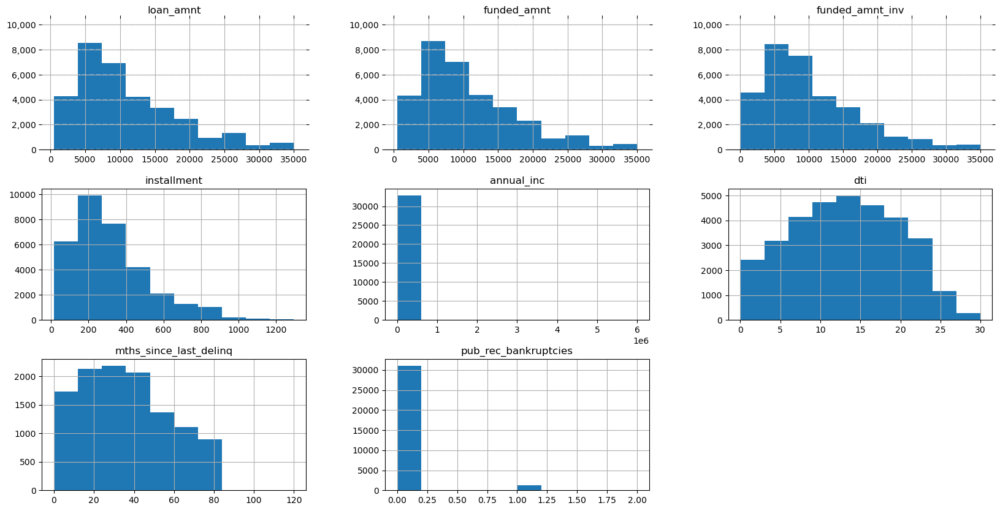

In [55]:
lc_fully_paid = lc_df[lc_df['loan_status'] == "Fully Paid"]
ax = lc_fully_paid.hist(figsize=(20,10))
ax = ax[0]
for x in ax:

    # Despine
    x.spines['right'].set_visible(False)
    x.spines['top'].set_visible(False)
    x.spines['left'].set_visible(False)

    # Switch off ticks
    x.tick_params(axis="both", which="both", bottom="off", top="off", labelbottom="on", left="off", right="off", labelleft="off")

    # Draw horizontal axis lines
    vals = x.get_yticks()
    for tick in vals:
        x.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

    # Format y-axis label
    x.yaxis.set_major_formatter(StrMethodFormatter('{x:,g}'))

<Axes: xlabel='loan_status'>

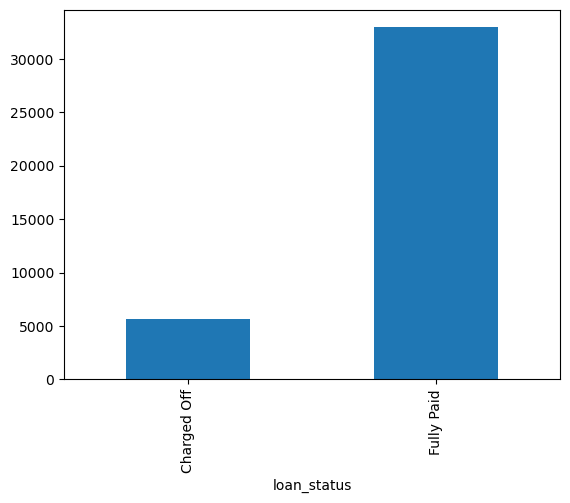

In [103]:
lc_df.groupby('loan_status').loan_amnt.count().plot.bar()
# lc_df['loan_status'].value_counts().plot.bar()

In [119]:
fig = px.bar(lc_df, y="loan_amnt", x="loan_status", color='loan_status')
fig.update_layout(width=700, height=500, bargap=0.05)
fig.show()

### Univariate and segmented univariate analysis is done correctly and appropriate realistic assumptions are made wherever required. The analyses successfully identify at least the 5 important driver variables (i.e. variables which are strong indicators of default).

#### Continuous variable are loan_amnt, funded_amnt_inv
#### Ordered categorical variable are term, grade, sub_grade